In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import itertools
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from PIL import Image
import warnings
warnings.filterwarnings("ignore")

In [2]:
def loading_the_data(data_dir):

    filepaths = []
    labels = []

    folds = os.listdir(data_dir)

    for fold in folds:
        foldpath = os.path.join(data_dir, fold)
        filelist = os.listdir(foldpath)
        for file in filelist:
            fpath = os.path.join(foldpath, file)
            
            filepaths.append(fpath)
            labels.append(fold)

    Fseries = pd.Series(filepaths, name='filepaths')
    Lseries = pd.Series(labels, name='labels')

    df = pd.concat([Fseries, Lseries], axis=1)
    
    return df


def change_label_names(df, column_name):
    index = {'colon_aca': 'colon_adenocarcinoma', 'colon_n': 'colon_benign_tissue'}
    df[column_name] = df[column_name].replace(index)
    

In [3]:
data_dir = '/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets'
df = loading_the_data(data_dir)

change_label_names(df, 'labels')

df

,filepaths,labels
0,/kaggle/input/lung-and-colon-cancer-histopatho...,colon_adenocarcinoma
1,/kaggle/input/lung-and-colon-cancer-histopatho...,colon_adenocarcinoma
2,/kaggle/input/lung-and-colon-cancer-histopatho...,colon_adenocarcinoma
3,/kaggle/input/lung-and-colon-cancer-histopatho...,colon_adenocarcinoma
4,/kaggle/input/lung-and-colon-cancer-histopatho...,colon_adenocarcinoma
...,...,...
9995,/kaggle/input/lung-and-colon-cancer-histopatho...,colon_benign_tissue
9996,/kaggle/input/lung-and-colon-cancer-histopatho...,colon_benign_tissue
9997,/kaggle/input/lung-and-colon-cancer-histopatho...,colon_benign_tissue
9998,/kaggle/input/lung-and-colon-cancer-histopatho...,colon_benign_tissue


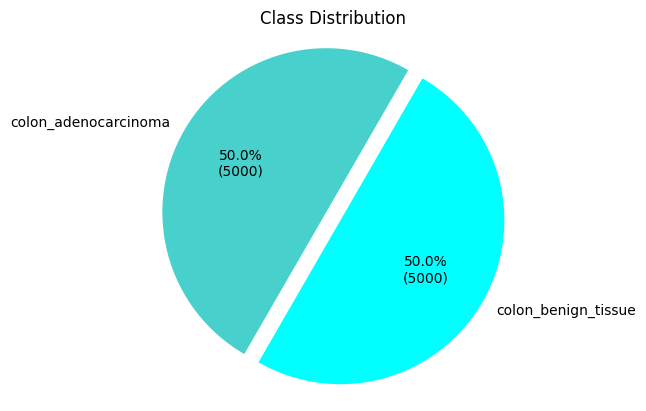

In [4]:
data_balance = df.labels.value_counts()


def custom_autopct(pct):
    total = sum(data_balance)
    val = int(round(pct*total/100.0))
    return "{:.1f}%\n({:d})".format(pct, val)


plt.pie(data_balance, explode=[0.1, 0], startangle=60, labels = data_balance.index, autopct=custom_autopct, colors = ['mediumturquoise', 'cyan'])
plt.title("Class Distribution")
plt.axis("equal")
plt.show()

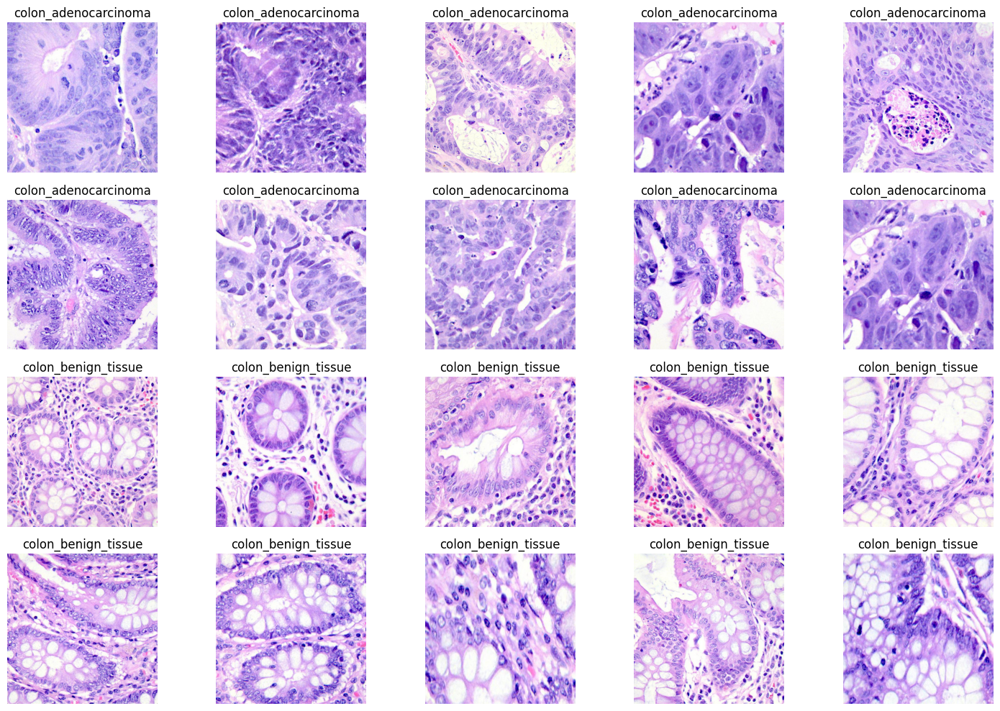

In [5]:
num_classes = 2
samples_per_class = 10

selected_images = (
    df.groupby('labels', group_keys=False)
    .apply(lambda x: x.sample(samples_per_class))
)

num_rows, num_columns = 4, 5


fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 10))
axes = axes.flatten()

for idx, (row, ax) in enumerate(zip(selected_images.iterrows(), axes)):
    img = Image.open(row[1]['filepaths'])
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(row[1]['labels'])

for ax in axes[len(selected_images):]:
    ax.axis('off')

plt.tight_layout()
plt.show()

In [6]:
train_df, ts_df = train_test_split(df, train_size = 0.7, shuffle = True, random_state = 42)
valid_df, test_df = train_test_split(ts_df, train_size = 0.5, shuffle = True, random_state = 42)

In [7]:
train_datagen = keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    brightness_range=(0.8, 1.2),
    rotation_range=10, 
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

valid_test_datagen = keras.preprocessing.image.ImageDataGenerator(rescale=1./255)


train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=None,  
    x_col='filepaths',  
    y_col='labels',  
    target_size=(224, 224),  
    batch_size=32,
    class_mode='categorical',  
    shuffle=True  
)

valid_generator = valid_test_datagen.flow_from_dataframe(
    dataframe=valid_df,
    directory=None,
    x_col='filepaths',
    y_col='labels',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False 
)

test_generator = valid_test_datagen.flow_from_dataframe(
    dataframe=test_df,
    directory=None,
    x_col='filepaths',
    y_col='labels',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False)

Found 7000 validated image filenames belonging to 2 classes.
Found 1500 validated image filenames belonging to 2 classes.
Found 1500 validated image filenames belonging to 2 classes.


In [8]:
class_counts = len(list(train_generator.class_indices.keys()))

In [9]:
class_counts

2

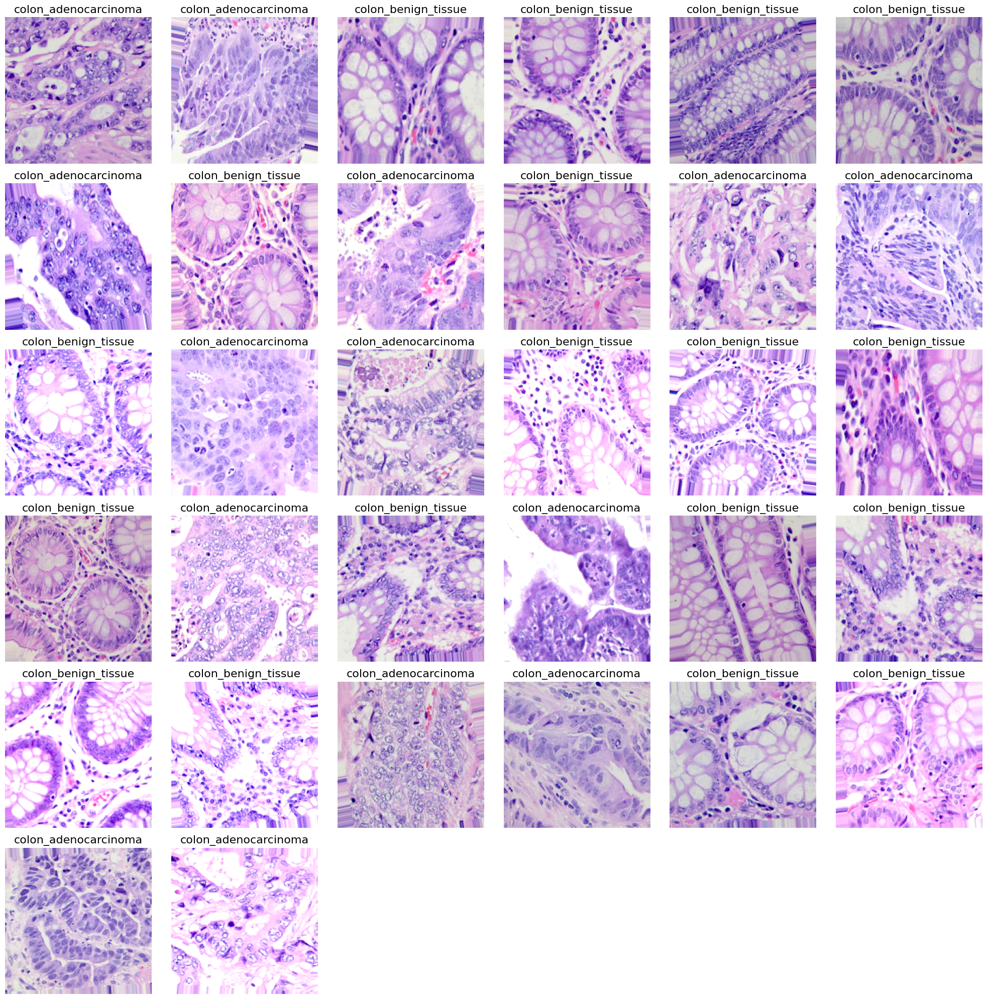

In [10]:
g_dict = train_generator.class_indices     
classes = list(g_dict.keys())     
images, labels = next(train_generator) 

plt.figure(figsize= (20, 20))

for i in range(32):
    plt.subplot(6, 6, i + 1)
    image = images[i]
    plt.imshow(image)
    index = np.argmax(labels[i]) 
    class_name = classes[index]   
    plt.title(class_name, color= 'black', fontsize= 16)
    plt.axis('off')
plt.tight_layout()
plt.show()

In [11]:
def sample_per_class(gen, set_name):
    print(f'Total samples in {set_name} set: {gen.samples}')
    class_counts = gen.classes
    unique, counts = np.unique(class_counts, return_counts=True)
    print(f"Samples per class on {set_name}: {dict(zip(unique, counts))}")

In [12]:
sample_per_class(train_generator, 'training')

Total samples in training set: 7000
Samples per class on training: {0: 3463, 1: 3537}


In [13]:
sample_per_class(valid_generator, 'validation')

Total samples in validation set: 1500
Samples per class on validation: {0: 770, 1: 730}


In [14]:
sample_per_class(test_generator, 'testing')

Total samples in testing set: 1500
Samples per class on testing: {0: 767, 1: 733}


# Create Model

In [15]:
class AttentionGate(keras.layers.Layer):
    def __init__(self, filters):
        super(AttentionGate, self).__init__()
        self.filters = filters
        self.conv1 = keras.layers.Conv2D(filters, (1, 1), activation='relu', padding='same')
        self.conv2 = keras.layers.Conv2D(filters, (1, 1), activation='sigmoid', padding='same')

    def call(self, x, g):
        combined = tf.concat([x, g], axis=-1)
        combined = self.conv1(combined)
        attention_map = self.conv2(combined) 
        output = x * attention_map 
        return output


base_model = keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))


for layer in base_model.layers:
    layer.trainable = False

for layer in base_model.layers:
    if isinstance(layer, keras.layers.Conv2D):
        layer.kernel_regularizer = keras.regularizers.l2(1e-4)


x = base_model.output 


g = keras.layers.Conv2D(512, (1, 1), activation='relu', padding='same')(x)

x = AttentionGate(filters=512)(x, g)

x = keras.layers.Flatten()(x)
x = keras.layers.Dense(units=256, activation='relu')(x)
x = keras.layers.Dropout(0.2)(x)

x = keras.layers.Dense(units=128, activation='relu')(x)
x = keras.layers.Dropout(0.2)(x)

x = keras.layers.Dense(units=class_counts, activation='sigmoid')(x)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [16]:
model = keras.Model(inputs=base_model.input, outputs=x)
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 224, 224,  │      1,792 │ input_layer[0][0] │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 224, 224,  │     36,928 │ block1_conv1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_pool         │ (None, 112, 112,  │          0 │ block1_conv2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv1        │ (None, 112, 112,  │     73,856 │ block1_pool[0][0] │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv2        │ (None, 112, 112,  │    147,584 │ block2_conv1[0][… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 56, 56,    │          0 │ block2_conv2[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv1        │ (None, 56, 56,    │    295,168 │ block2_pool[0][0] │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv2        │ (None, 56, 56,    │    590,080 │ block3_conv1[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv3        │ (None, 56, 56,    │    590,080 │ block3_conv2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_pool         │ (None, 28, 28,    │          0 │ block3_conv3[0][… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv1        │ (None, 28, 28,    │  1,180,160 │ block3_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv2        │ (None, 28, 28,    │  2,359,808 │ block4_conv1[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv3        │ (None, 28, 28,    │  2,359,808 │ block4_conv2[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_pool         │ (None, 14, 14,    │          0 │ block4_conv3[0][… │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv1        │ (None, 14, 14,    │  2,359,808 │ block4_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv2        │ (None, 14, 14,    │  2,359,808 │ block5_conv1[0][

 Total params: 22,220,738 (84.77 MB)

 Trainable params: 7,506,050 (28.63 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [17]:
model.compile(
    loss='binary_crossentropy',
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    metrics=['accuracy', 'precision', 'recall', 'auc']
)


In [18]:
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3)

In [19]:
history = model.fit(train_generator, epochs=20, validation_data=valid_generator, batch_size=32, callbacks=[reduce_lr, early_stopping])

Epoch 1/20


I0000 00:00:1732819279.793950      69 service.cc:145] XLA service 0x7cd774001410 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732819279.794009      69 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  2/219 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5781 - auc: 0.6354 - loss: 0.6828 - precision: 0.5515 - recall: 0.5781   

I0000 00:00:1732819292.399326      69 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


219/219 ━━━━━━━━━━━━━━━━━━━━ 169s 685ms/step - accuracy: 0.9231 - auc: 0.9664 - loss: 0.1875 - precision: 0.9133 - recall: 0.9165 - val_accuracy: 0.9947 - val_auc: 0.9999 - val_loss: 0.0117 - val_precision: 0.9960 - val_recall: 0.9947 - learning_rate: 0.0010
Epoch 2/20
219/219 ━━━━━━━━━━━━━━━━━━━━ 105s 464ms/step - accuracy: 0.9896 - auc: 0.9991 - loss: 0.0329 - precision: 0.9888 - recall: 0.9883 - val_accuracy: 0.9960 - val_auc: 1.0000 - val_loss: 0.0085 - val_precision: 0.9960 - val_recall: 0.9960 - learning_rate: 0.0010
Epoch 3/20
219/219 ━━━━━━━━━━━━━━━━━━━━ 106s 469ms/step - accuracy: 0.9918 - auc: 0.9997 - loss: 0.0183 - precision: 0.9924 - recall: 0.9915 - val_accuracy: 0.9993 - val_auc: 1.0000 - val_loss: 0.0026 - val_precision: 0.9993 - val_recall: 0.9993 - learning_rate: 0.0010
Epoch 4/20
219/219 ━━━━━━━━━━━━━━━━━━━━ 104s 462ms/step - accuracy: 0.9936 - auc: 0.9999 - loss: 0.0145 - precision: 0.9935 - recall: 0.9938 - val_accuracy: 0.9960 - val_auc: 1.0000 - val_loss: 0.0055 

In [20]:
def model_performance(history, Epochs):
    # Define needed variables
    tr_acc = history.history['accuracy']
    tr_loss = history.history['loss']
    val_acc = history.history['val_accuracy']
    val_loss = history.history['val_loss']
    precision = history.history['precision']
    val_pre = history.history['val_precision']
    recall = history.history['recall']
    val_rec = history.history['val_recall']
    auc = history.history['auc']
    val_auc = history.history['val_auc']
    
    Epochs = [i+1 for i in range(len(tr_acc))]
    
    # Plot training history
    plt.figure(figsize= (20, 15))
    sns.set_style('darkgrid')
    
    plt.subplot(3, 2, 1)
    plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
    plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.subplot(3, 2, 2)
    plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(3, 2, 3)
    plt.plot(Epochs, precision, 'r', label= 'Training Precision')
    plt.plot(Epochs, val_pre, 'g', label= 'Validation Precision')
    plt.title('Training and Validation Precision')
    plt.xlabel('Epochs')
    plt.ylabel('Precision')
    plt.legend()

    plt.subplot(3, 2, 4)
    plt.plot(Epochs, recall, 'r', label= 'Training Recall')
    plt.plot(Epochs, val_rec, 'g', label= 'Validation Recall')
    plt.title('Training and Validation Recall')
    plt.xlabel('Epochs')
    plt.ylabel('Recall')
    plt.legend()


    plt.subplot(3, 2, 5)
    plt.plot(Epochs, auc, 'r', label= 'Training AUC')
    plt.plot(Epochs, val_auc, 'g', label= 'Validation AUC')
    plt.title('Training and Validation AUC')
    plt.xlabel('Epochs')
    plt.ylabel('AUC')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

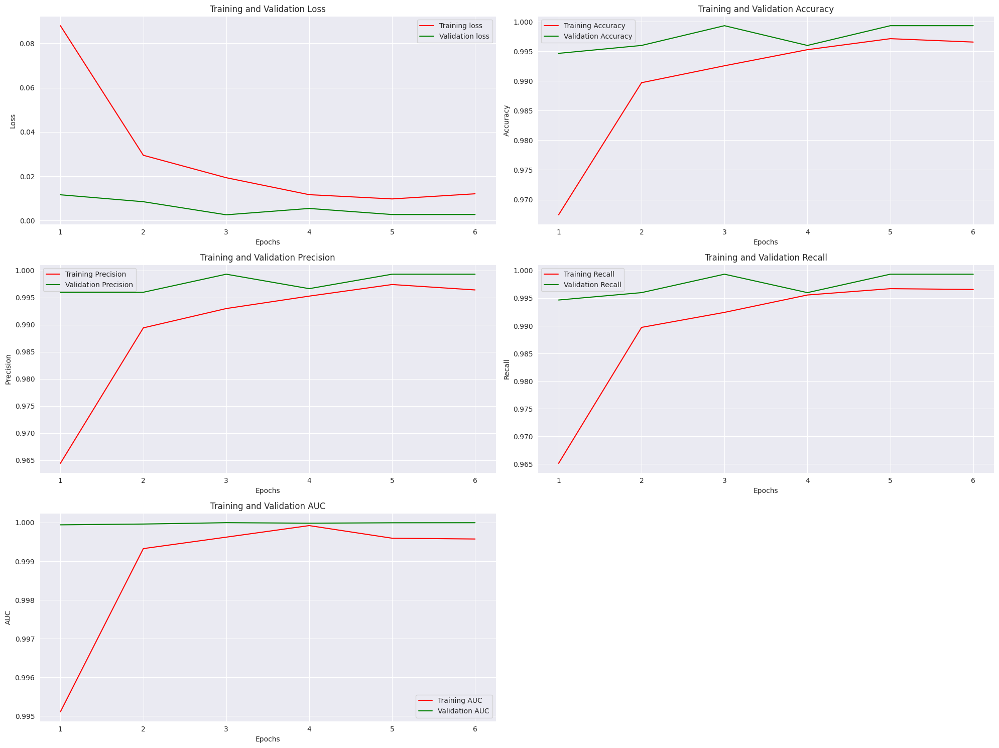

In [21]:
model_performance(history, 10)

In [22]:
def model_evaluation(model):
    train_score = model.evaluate(train_generator, verbose= 0)
    valid_score = model.evaluate(valid_generator, verbose= 0)
    test_score = model.evaluate(test_generator, verbose= 0)
    
    print("Train Loss: ", train_score[0])
    print("Train Accuracy: ", train_score[1])
    print('Train Precision: ', train_score[2])
    print('Train Recall: ', train_score[3])
    print('Train AUC: ', train_score[4])
    print('-' * 20)
    
    print("Validation Loss: ", valid_score[0])
    print("Validation Accuracy: ", valid_score[1])
    print('Valdidation Precision: ', valid_score[2])
    print('validation Recall: ', valid_score[3])
    print('validationo AUC: ', valid_score[4])
    print('-' * 20)
    
    print("Test Loss: ", test_score[0])
    print("Test Accuracy: ", test_score[1])
    print('Test Precision: ', test_score[2])
    print('Test Recall: ', test_score[3])
    print('Test AUC: ', test_score[4])

In [23]:
model_evaluation(model)

Train Loss:  0.0061613889411091805
Train Accuracy:  0.9978571534156799
Train Precision:  0.9979997277259827
Train Recall:  0.9978571534156799
Train AUC:  0.9999750852584839
--------------------
Validation Loss:  0.0026214607059955597
Validation Accuracy:  0.9993333220481873
Valdidation Precision:  0.9993333220481873
validation Recall:  0.9993333220481873
validationo AUC:  0.9999969005584717
--------------------
Test Loss:  0.0072124311700463295
Test Accuracy:  0.9986666440963745
Test Precision:  0.9986666440963745
Test Recall:  0.9986666440963745
Test AUC:  0.9993126392364502


47/47 ━━━━━━━━━━━━━━━━━━━━ 7s 135ms/step


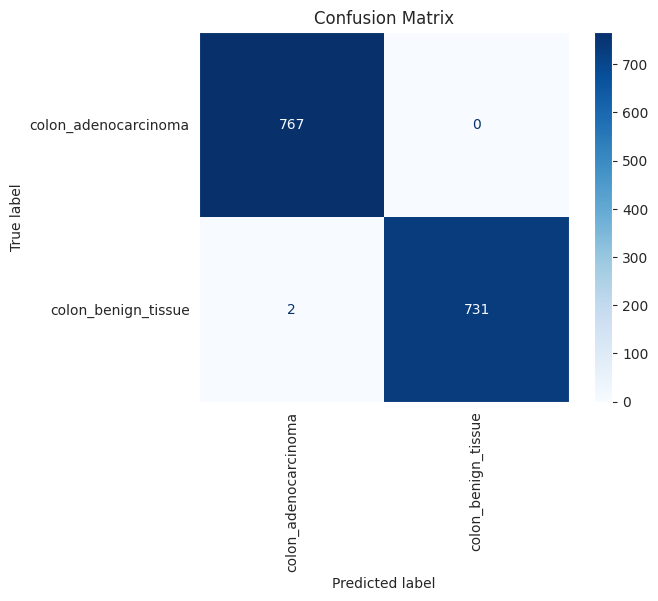

In [24]:

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


# Step 1: Predict using the model
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)  # Convert probabilities to class indices

# Step 2: Get true labels
true_classes = test_generator.classes  # True class indices from test_generator

# Step 3: Get class labels
class_labels = list(test_generator.class_indices.keys())  # List of class names

# Step 4: Compute the confusion matrix
cm = confusion_matrix(true_classes, predicted_classes)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues, xticks_rotation='vertical')

plt.title('Confusion Matrix')
plt.grid(False)
plt.show()


In [25]:
model.save('ColonCancer_VGGNet.h5')